In [1]:
from distutils.dir_util import copy_tree
copy_tree("../input/ring-zoobot/", "./input")

['./input/zoobot/CODE_OF_CONDUCT.md',
 './input/zoobot/tests/pytorch/test_train_with_pytorch_lightning.py',
 './input/zoobot/tests/pytorch/test_define_model.py',
 './input/zoobot/tests/pytorch/test_finetune_classifier.py',
 './input/zoobot/tests/test_from_hub.py',
 './input/zoobot/tests/test_loss_equivalence.py',
 './input/zoobot/Dockerfile',
 './input/zoobot/common_install_issues.md',
 './input/zoobot/LICENSE',
 './input/zoobot/.gitignore',
 './input/zoobot/benchmarks/pytorch/run_dataset_benchmark.sh',
 './input/zoobot/benchmarks/pytorch/run_benchmarks.sh',
 './input/zoobot/benchmarks/pytorch/train_model_on_benchmark_dataset.py',
 './input/zoobot/benchmarks/tensorflow/run_dataset_benchmark.sh',
 './input/zoobot/benchmarks/tensorflow/deprecated/single_task_version_not_recommended/train_single_task_model.py',
 './input/zoobot/benchmarks/tensorflow/run_benchmarks.sh',
 './input/zoobot/benchmarks/tensorflow/train_model_on_benchmark_dataset.py',
 './input/zoobot/benchmarks/comparison_debug

In [2]:
pip install /kaggle/working/input/zoobot  "zoobot[pytorch-cu121]" --extra-index-url https://download.pytorch.org/whl/cu121

Looking in indexes: https://pypi.org/simple, https://download.pytorch.org/whl/cu121
Processing ./input/zoobot
  Installing build dependencies ... - \ | / - \ | / done
  Getting requirements to build wheel ... - done
  Preparing metadata (pyproject.toml) ... - done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 GB ? eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.0/7.0 MB 87.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.4/53.4 kB 1.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.2/89.2 MB 19.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 512.4/512.4 kB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.3/57.3 kB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 24.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 745.2/745.2 kB 36.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 70.4/70.4 kB 5.0 MB/s eta 0:00:00
  Created 

In [3]:
import pandas as pd
import numpy as np
import logging
import os
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score

import matplotlib.pyplot as plt
from PIL import Image

def show_rings_2(df):
  # little utility function to visualise galaxies on catalog

    fig, axes = plt.subplots(ncols=5,nrows = 5, figsize=(16, 16))
    for i in range(5):
        for j in range(5):
            galaxy = df.iloc[i*5+j]
            
            im = Image.open(galaxy['file_loc'])
            axes[i,j].imshow(im)
            
            axes[i,j].text(20, 50, 'Pred: {:.2f}'.format(galaxy['ring_pred']), color='g')
            axes[i,j].set_title(galaxy['iauname'])
            axes[i,j].axis('off')
                     

pd.options.display.max_columns = None
pd.options.mode.chained_assignment = None

In [4]:
from galaxy_datasets.pytorch.galaxy_datamodule import GalaxyDataModule
from zoobot.pytorch.training.finetune import FinetuneableZoobotClassifier, get_trainer
from zoobot.pytorch.predictions import predict_on_catalog
from galaxy_datasets import gz_decals_5  # or gz_hubble, gz_candels, ...

logging.basicConfig(level=logging.INFO)

GZDESI/GZRings/GZCD not available from galaxy_datasets.pytorch.datasets - skipping


In [5]:
gzd5_catalog_train, _ = gz_decals_5(
    root='../input/gzd5-data/gzd5',
    train=True,
    download=False
)

gzd5_catalog_test, _ = gz_decals_5(
    root='../input/gzd5-data/gzd5',
    train=False,
    download=False
)
gzd5_catalog = pd.concat([gzd5_catalog_train,gzd5_catalog_test])
gzd5_catalog = gzd5_catalog[['iauname','file_loc']].reset_index(drop=True).reset_index(names=['id_str'])
#----
gzd5_catalog_train = pd.read_csv('../input/ring-train-test/gzd5_catalog_train.csv')
gzd5_catalog_test = pd.read_csv('../input/ring-train-test/gzd5_catalog_test.csv')
gzd5_catalog_val = pd.read_csv('../input/ring-train-test/gzd5_catalog_val.csv')

gzd5_train_test_val = pd.concat([gzd5_catalog_train,gzd5_catalog_test,gzd5_catalog_val])
gzd5_train_test_val.file_loc = '../input/gzd5-data/' + gzd5_train_test_val.file_loc.str.split('/',n=1).str[1]

gzd5_rings = gzd5_train_test_val[gzd5_train_test_val.ring == 1].file_loc.unique().tolist()

gzd5_catalog_not_labeled = gzd5_catalog[~gzd5_catalog.file_loc.isin(gzd5_rings)]

In [6]:
def inference(checkpoint_path, gzd5_catalog,pred_path):
    finetuned_model = FinetuneableZoobotClassifier.load_from_checkpoint(checkpoint_path)
    _ = predict_on_catalog.predict(
                  gzd5_catalog,
                  finetuned_model,
                  n_samples=1,
                  label_cols=['not_ring', 'ring'],
                  save_loc=pred_path,
                  datamodule_kwargs={'num_workers': 2, 'batch_size': 64, 'greyscale': False},  # we also need to set batch size here, or you may run out of memory
                  trainer_kwargs={'accelerator': 'gpu','devices' : 1}  
                )

    predictions_all = pd.read_csv(pred_path)
    predictions_all.id_str = predictions_all.id_str.astype(int)
    predictions_all = pd.merge(predictions_all, gzd5_catalog[['id_str', 'file_loc', 'iauname']])

    top_25_predictions = predictions_all.sort_values('ring_pred', ascending=False)
    show_rings_2(top_25_predictions)
    bottom_25_predictions = predictions_all.sort_values('ring_pred', ascending=True)
    show_rings_2(bottom_25_predictions)
    random_predictions = predictions_all.sample(25)
    show_rings_2(random_predictions)

config.json:   0%|          | 0.00/660 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/198M [00:00<?, ?B/s]

2024-04-27 00:51:18.362883: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-27 00:51:18.363012: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-27 00:51:18.486249: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


Predicting: |          | 0/? [00:00<?, ?it/s]

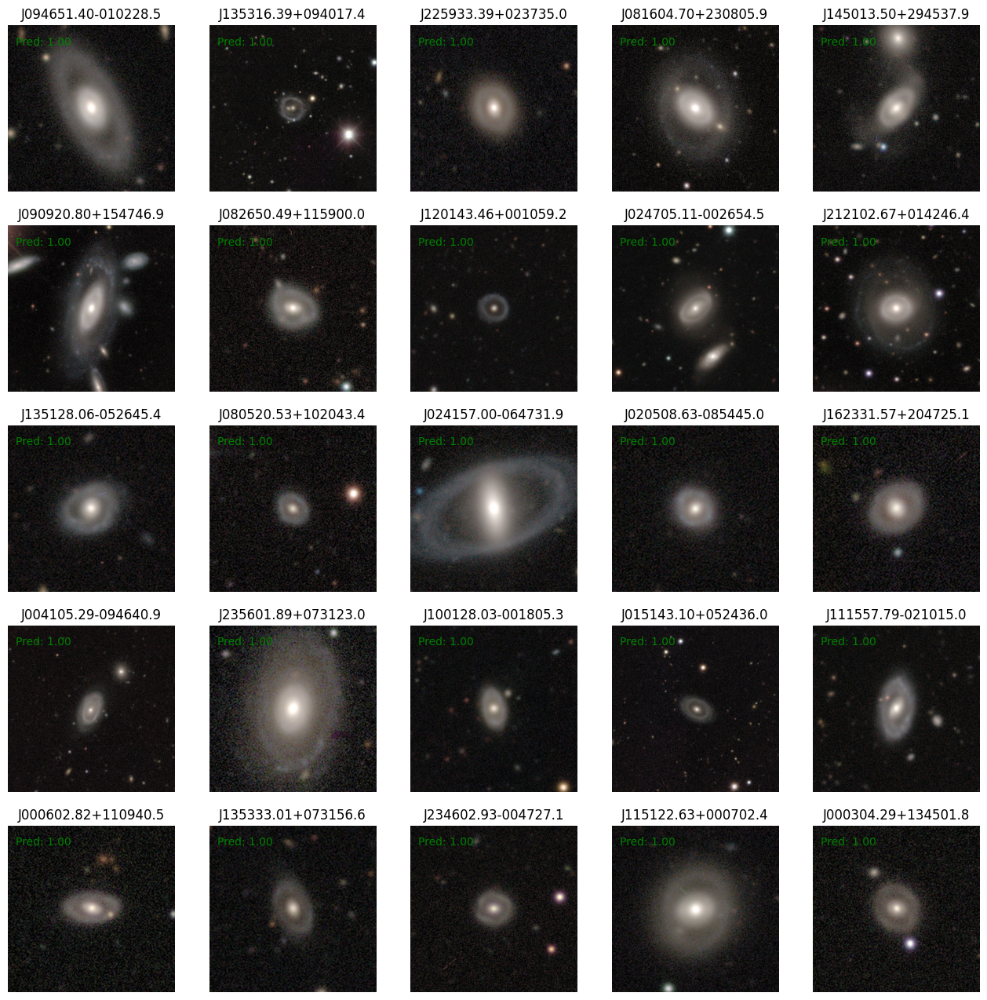

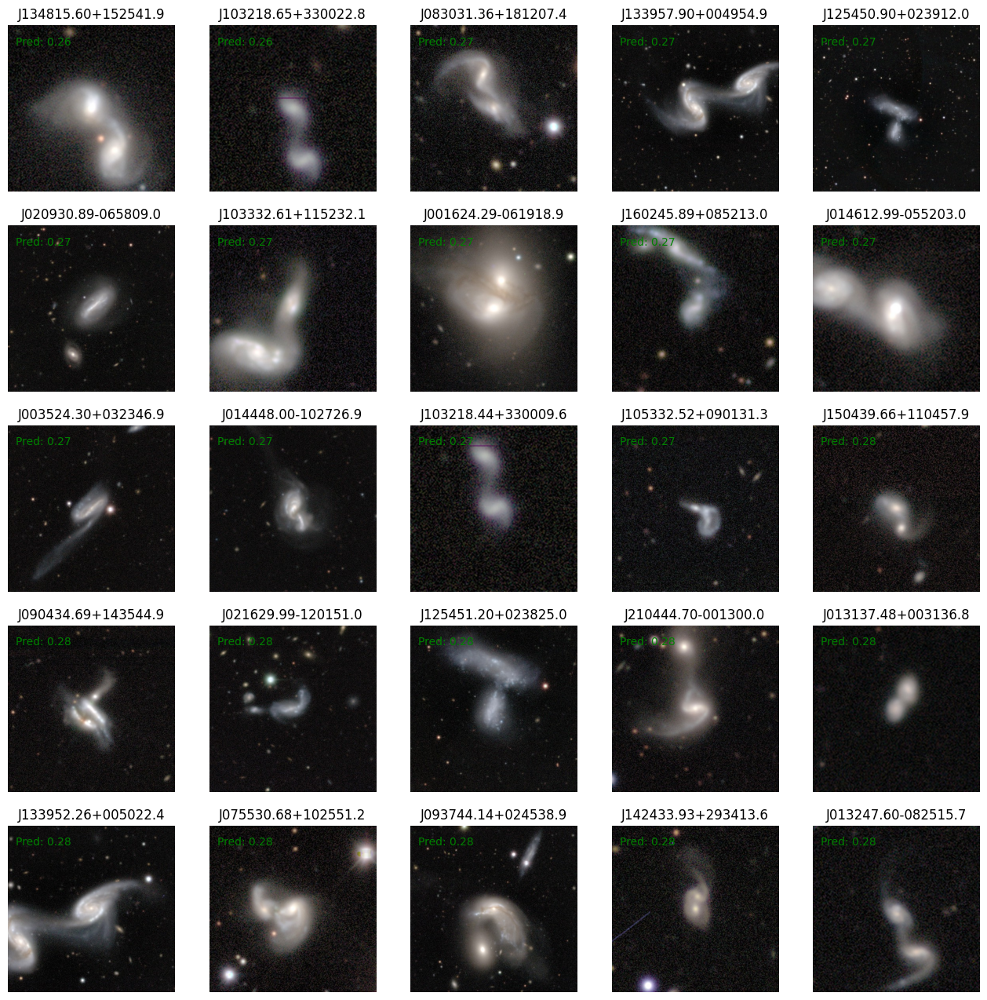

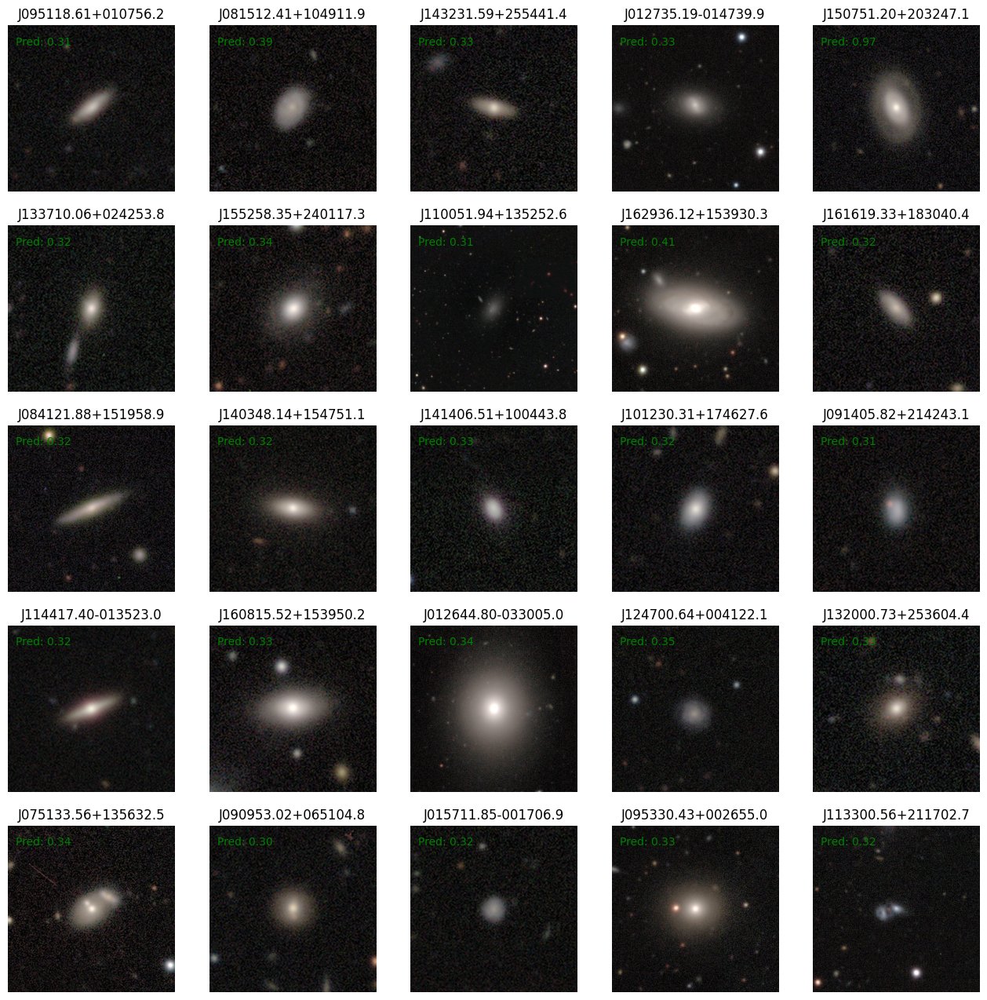

In [7]:
inference('../input/top-models/convnext_small-1-cosine.ckpt',gzd5_catalog_not_labeled,'predictions_all_small-1-cosine.csv')

config.json:   0%|          | 0.00/664 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/350M [00:00<?, ?B/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

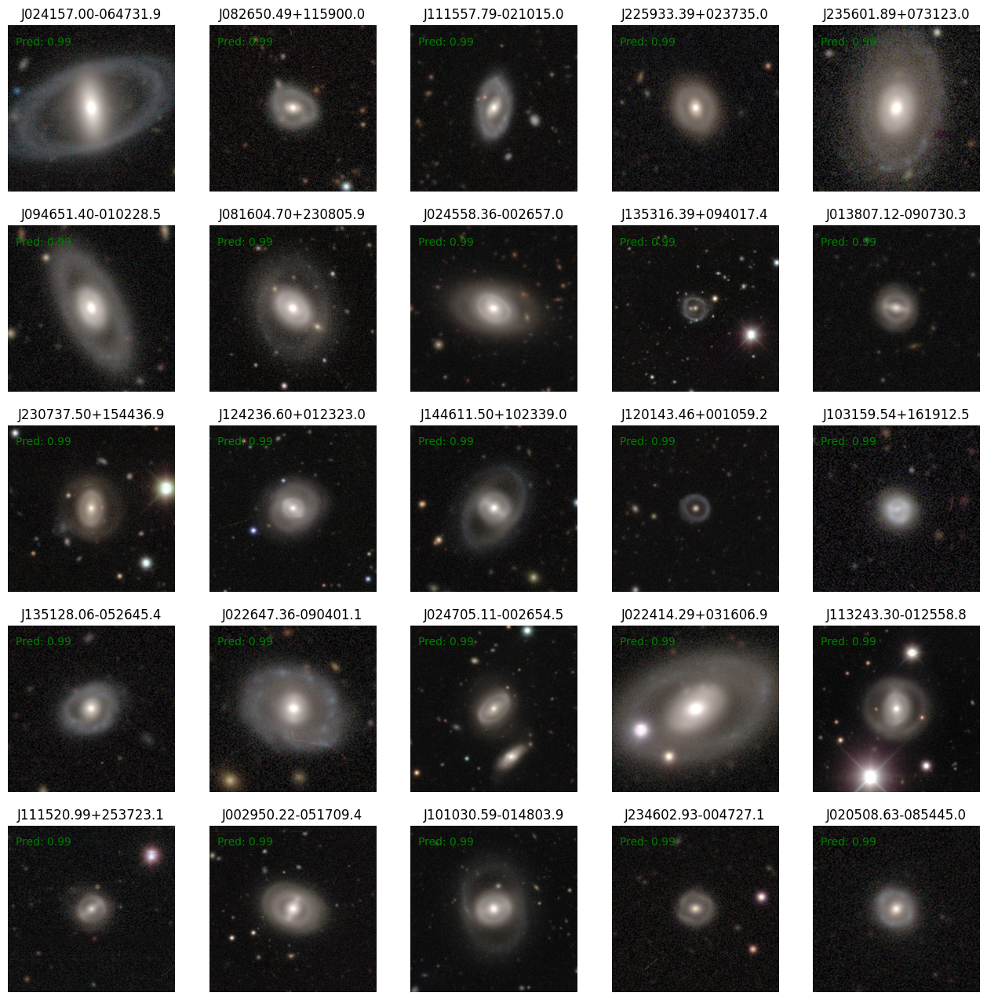

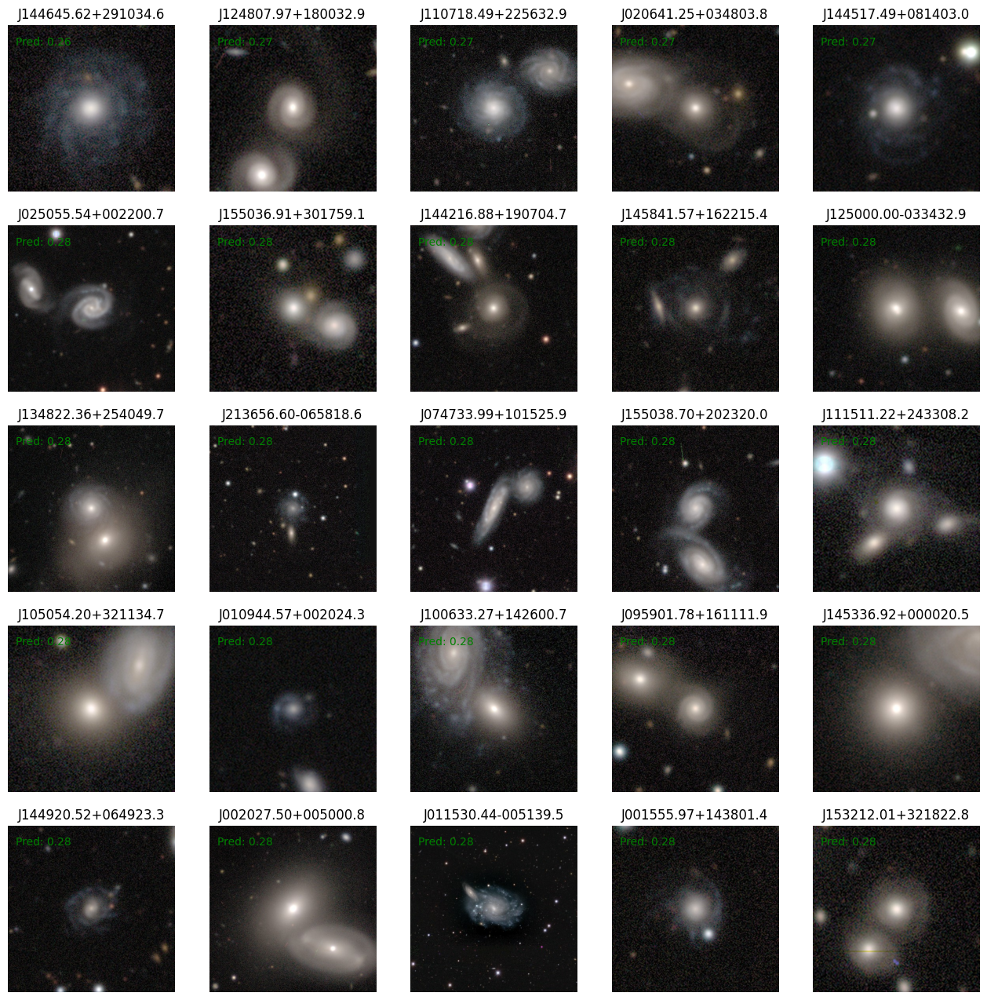

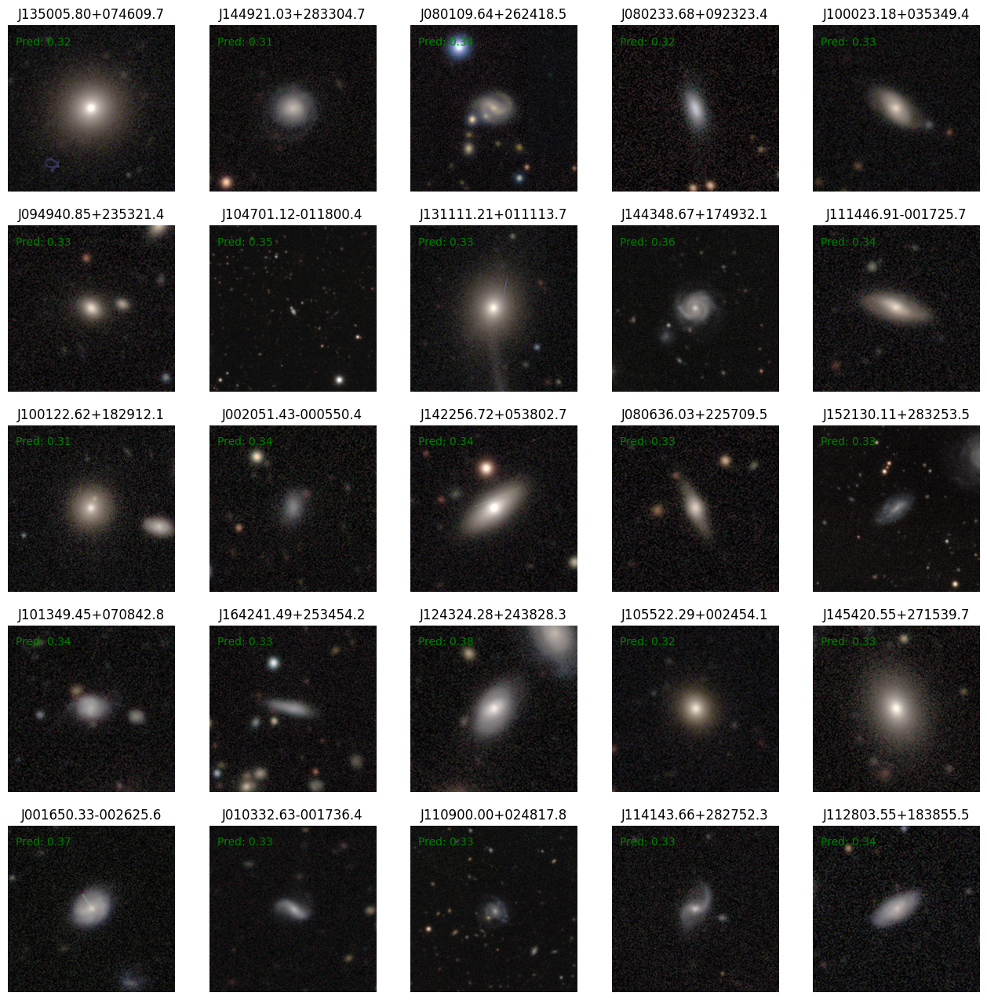

In [8]:
inference('../input/top-models/convnext_base-1-cosine.ckpt',gzd5_catalog_not_labeled,'predictions_all_base-1-cosine.csv')